In [27]:
from freecond_src.freecond_utils import get_pipeline_forward
from freecond_src.freecond import FC_config
from diffusers import DDIMScheduler
from PIL import Image
import torch

torch.cuda.set_device(0)
pipeline, forward = get_pipeline_forward(method="sd")

# pipeline, forward = get_pipeline_forward(method="cn")

# pipeline, forward = get_pipeline_forward(method="hdp",variant="sd15",device="cuda")

# pipeline, forward = get_pipeline_forward(method="pp",device="cuda")

# pipeline, forward = get_pipeline_forward(method="bn",device="cuda")

# pipeline, forward = get_pipeline_forward(method="sdxl")

# pipeline.scheduler=DDIMScheduler.from_config(pipeline.scheduler.config) # This was used during the experiment


# pipeline, forward = get_pipeline_forward(method="flux", device="cuda")

from freecond_src.bays import SurrogateOptimizer

optimizer = SurrogateOptimizer("fcip_surrogate_model.pkl")

❗❗❗ Be sure using correct python environment, the python environment are different for methods 
🔄 Building Stable-Diffusion-Inpainting FreeCond control...
# Load backbone model
## Load backbone model = Stable Diffusion Inpainting 1.5


Loading pipeline components...:  57%|█████▋    | 4/7 [00:00<00:00,  4.36it/s]An error occurred while trying to fetch /nfs/home/bluedyee/.cache/huggingface/hub/models--sd-legacy--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /nfs/home/bluedyee/.cache/huggingface/hub/models--sd-legacy--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipeline components...:  71%|███████▏  | 5/7 [00:03<00:01,  1.01it/s]An error occurred while trying to fetch /nfs/home/bluedyee/.cache/huggingface/hub/models--sd-legacy--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /nfs/home/bluedyee/.cache/huggingface/hub/models--sd-legacy--stable-diffusion-inpainting/s

# load trainer parameters
  param_bounds: {'fg': (1, 4), 'bg': (0.0, 0.8), 'fqth': (8, 32)}
  output_names: ['Image Reward', 'HPS V2.1', 'PSNR', 'LPIPS', 'CLIP Similarity', 'IoU Score', 'DINO']


100%|██████████| 50/50 [00:02<00:00, 17.98it/s]



>> Empirical Optimization
weights {'Image Reward': 1.0, 'HPS V2.1': 2.0, 'LPIPS': -1.0, 'CLIP Similarity': 0.5, 'IoU Score': 0.5, 'DINO': 5}
constraints {'LPIPS': (-inf, 0.5)}
Initializing Bayesian Optimization...
  acquisition_type: LCB

Best param:
  fg: 1.0000
  bg: 0.0000
  fqth: 21.7647

Prediction:
  Image Reward: 0.3546 ± 0.0528
  HPS V2.1: 0.0269 ± 0.0085
  PSNR: -0.0251 ± 0.0021
  LPIPS: 0.2259 ± 0.0192
  CLIP Similarity: 0.2498 ± 0.0182
  IoU Score: 2.7260 ± 0.2536
  DINO: -0.0432 ± 0.0027


100%|██████████| 50/50 [00:02<00:00, 18.84it/s]


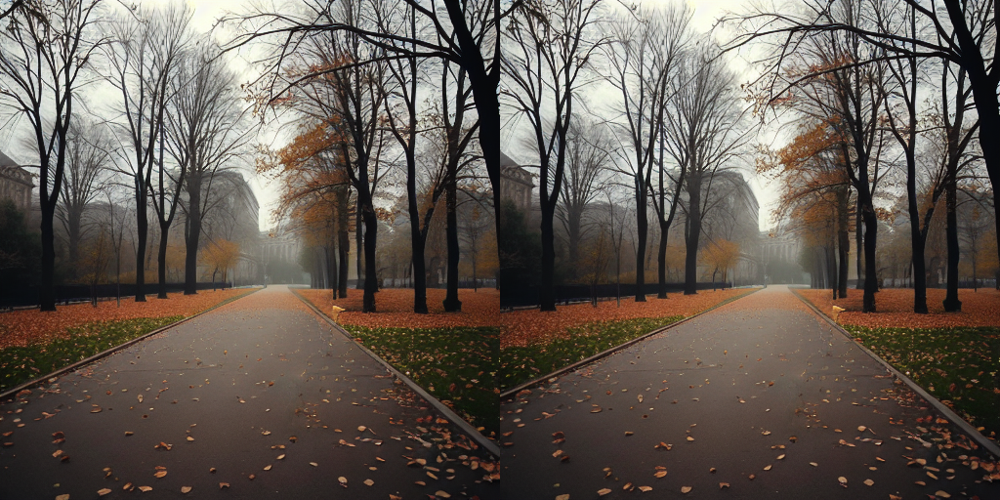

In [28]:
from diffusers.utils import make_image_grid
import torch

# ❗ The demonstration output aren't identical the reported images in our research paper.
# Because we delete some unnecessary operation during revision, leading to the change of effect about random seed.

mask = Image.open("./demo_data/mask_1_2.png").convert("L").resize((512, 512))
init_image = Image.open("./demo_data/img_1_2.jpg").convert("RGB").resize((512, 512))
prompt = "A golden retriever wearing astronaut gear, in cyberpunk style"
nprompt = "word, bad quality, bad anatomy, ugly, mutation, blurry, error"
add_on_dict = {"latent_recovery": {}}

out_list = []
# Default to SDI
fc_control = FC_config(
    change_step=0,
    fg_1=1,
    fg_2=1,
    bg_1=0,
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=32,
    add_on=add_on_dict,
)
# Setting FreeCond control for SDI15
torch.manual_seed(777)
default_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
out_list.append(default_out[0])

surrogate_metrics = [
    "Image Reward",
    "HPS V2.1",
    "PSNR",
    "LPIPS",
    "CLIP Similarity",
    "IoU Score",
    "DINO",
]
weights = {
    "Image Reward": 1.0,
    "HPS V2.1": 2.0,
    "LPIPS": -1.0,
    "CLIP Similarity": 0.5,
    "IoU Score": 0.5,
    "DINO": 5,
}
# weights = {'Image Reward': 1.0, 'HPS V2.1': 12.0, 'LPIPS': -10.0, 'CLIP Similarity': 0.5, 'IoU Score': 0.5, "DINO":50}
constraints = {"LPIPS": (-float("inf"), 0.5)}
print("\n>> Empirical Optimization")
print("weights", weights)
print("constraints", constraints)
best_params, predictions = optimizer.optimize(
    weights=weights,
    constraints=constraints,
    report_file="bays_run/bays_optimize_report.txt",
    evaluations_file="bays_run/bays_optimize_evaluation.csv",
)

fc_control = FC_config(
    change_step=30,
    fg_1=best_params[0],
    fg_2=1,
    bg_1=best_params[1],
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=int(best_params[2]),
    add_on=add_on_dict,
)
# Setting FreeCond control for SDI15
torch.manual_seed(777)
opt_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
out_list.append(opt_out[0])

make_image_grid(out_list, rows=1, cols=len(out_list))

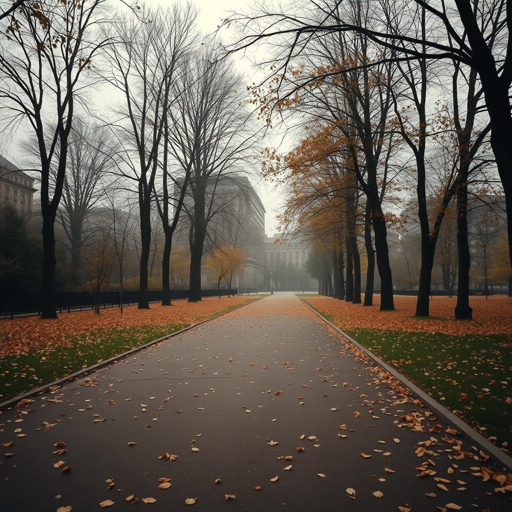

In [30]:
init_image

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:02<00:00, 19.00it/s]


>> Empirical Optimization
weights {'CLIP Similarity': 1, 'IoU Score': 1}
constraints {'LPIPS': (-inf, 0.5)}
Initializing Bayesian Optimization...
  acquisition_type: LCB



Best param:
  fg: 4.0000
  bg: 0.8000
  fqth: 21.4649

Prediction:
  Image Reward: 0.1000 ± 0.0197
  HPS V2.1: -0.0212 ± 0.0026
  PSNR: -0.0454 ± 0.0008
  LPIPS: 0.2105 ± 0.0084
  CLIP Similarity: 0.1355 ± 0.0061
  IoU Score: 2.4073 ± 0.0469
  DINO: -0.0337 ± 0.0008


100%|██████████| 50/50 [00:02<00:00, 18.79it/s]


>> Empirical Optimization
weights {'Image Reward': 1.0, 'HPS V2.1': 12.0, 'LPIPS': -10.0, 'CLIP Similarity': 0.5, 'IoU Score': 0.5, 'DINO': 5}
constraints {'LPIPS': (-inf, 0.5)}
Initializing Bayesian Optimization...
  acquisition_type: EI



Best param:
  fg: 1.0000
  bg: 0.8000
  fqth: 24.2101

Prediction:
  Image Reward: 0.3170 ± 0.0441
  HPS V2.1: 0.0644 ± 0.0074
  PSNR: -0.0235 ± 0.0018
  LPIPS: 0.0376 ± 0.0160
  CLIP Similarity: 0.1666 ± 0.0153
  IoU Score: 0.9805 ± 0.2394
  DINO: -0.0235 ± 0.0023


100%|██████████| 50/50 [00:02<00:00, 18.86it/s]


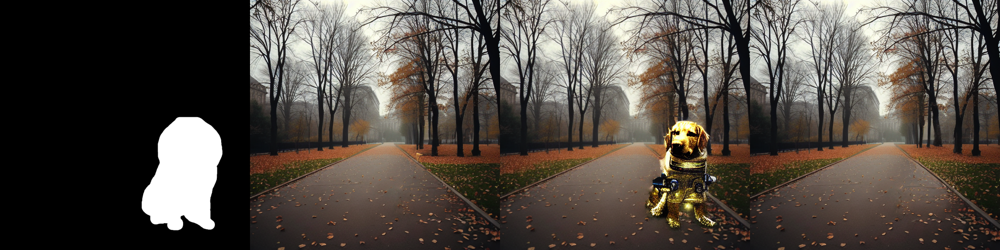

In [31]:
from diffusers.utils import make_image_grid
import torch
import numpy as np

# ❗ The demonstration output aren't identical the reported images in our research paper.
# Because we delete some unnecessary operation during revision, leading to the change of effect about random seed.

mask = Image.open("./demo_data/mask_1_2.png").convert("L").resize((512, 512))
init_image = Image.open("./demo_data/img_1_2.jpg").convert("RGB").resize((512, 512))
prompt = "A golden retriever wearing astronaut gear, in cyberpunk style"
nprompt = "word, bad quality, bad anatomy, ugly, mutation, blurry, error"
add_on_dict = {"latent_recovery": {}}

out_list = [mask]
# Default to SDI
fc_control = FC_config(
    change_step=0,
    fg_1=1,
    fg_2=1,
    bg_1=0,
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=32,
    add_on=add_on_dict,
)
# Setting FreeCond control for SDI15
torch.manual_seed(777)
default_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
out_list.append(default_out[0])

surrogate_metrics = [
    "Image Reward",
    "HPS V2.1",
    "PSNR",
    "LPIPS",
    "CLIP Similarity",
    "IoU Score",
    "DINO",
]
weights = {"CLIP Similarity": 1, "IoU Score": 1}
# weights = {'Image Reward': 1.0, 'HPS V2.1': 12.0, 'LPIPS': -10.0, 'CLIP Similarity': 0.5, 'IoU Score': 0.5, "DINO":50}
constraints = {"LPIPS": (-float("inf"), 0.5)}
print("\n>> Empirical Optimization")
print("weights", weights)
print("constraints", constraints)
np.random.seed(777)
best_params, predictions = optimizer.optimize(
    weights=weights,
    constraints=constraints,
    max_iter=50,
    acquisition_type="LCB",
    report_file="bays_run/bays_optimize_report.txt",
    evaluations_file="bays_run/bays_optimize_evaluation_1.csv",
)

fc_control = FC_config(
    change_step=30,
    fg_1=best_params[0],
    fg_2=1,
    bg_1=best_params[1],
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=int(best_params[2]),
    add_on=add_on_dict,
)
# Setting FreeCond control for SDI15
torch.manual_seed(777)
opt_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
out_list.append(opt_out[0])

# weights = {"CLIP Similarity": 1, "IoU Score": 1}
weights = {'Image Reward': 1.0, 'HPS V2.1': 12.0, 'LPIPS': -10.0, 'CLIP Similarity': 0.5, 'IoU Score': 0.5, "DINO":5}
constraints = {"LPIPS": (-float("inf"), 0.5)}
print("\n>> Empirical Optimization")
print("weights", weights)
print("constraints", constraints)
np.random.seed(777)
best_params, predictions = optimizer.optimize(
    weights=weights,
    constraints=constraints,
    max_iter=50,
    acquisition_type="EI",
    report_file="bays_run/bays_optimize_report.txt",
    evaluations_file="bays_run/bays_optimize_evaluation_2.csv",
)

fc_control = FC_config(
    change_step=30,
    fg_1=best_params[0],
    fg_2=1,
    bg_1=best_params[1],
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=int(best_params[2]),
    add_on=add_on_dict,
)
# Setting FreeCond control for SDI15
torch.manual_seed(777)
opt_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
out_list.append(opt_out[0])

make_image_grid(out_list, rows=1, cols=len(out_list))

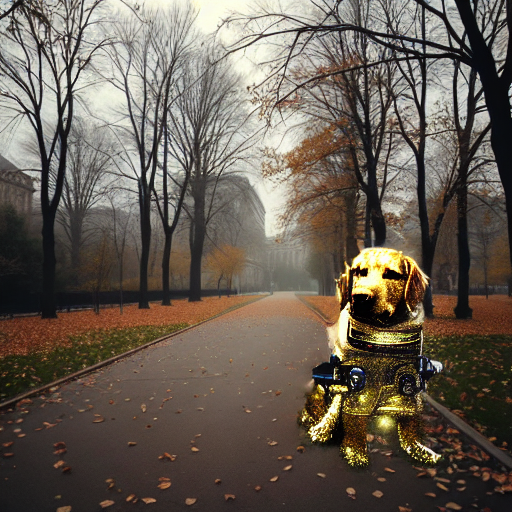

In [49]:
out_list[2]

In [ ]:
weights = {'Image Reward': 5.0, 'HPS V2.1': 5.0, 'CLIP Similarity': 0.5, 'IoU Score': 1}
constraints = {"LPIPS": (-float("inf"), 0.5)}
print("\n>> Empirical Optimization")
print("weights", weights)
print("constraints", constraints)
np.random.seed(777)
best_params, predictions = optimizer.optimize(
    weights=weights,
    constraints=constraints,
    max_iter=2,
    acquisition_type="LCB",
    report_file="bays_run/bays_optimize_report.txt",
    evaluations_file="bays_run/bays_optimize_evaluation_2.csv",
)

fc_control = FC_config(
    change_step=30,
    fg_1=best_params[0],
    fg_2=1,
    bg_1=best_params[1],
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=int(best_params[2]),
    add_on=add_on_dict,
)
# Setting FreeCond control for SDI15
torch.manual_seed(777)
opt_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
opt_out[0]


>> Empirical Optimization
weights {'Image Reward': 5.0, 'HPS V2.1': 5.0, 'CLIP Similarity': 0.5, 'IoU Score': 1}
constraints {'LPIPS': (-inf, 0.5)}
Initializing Bayesian Optimization...
  acquisition_type: LCB

Best param:
  fg: 1.0000
  bg: 0.8000
  fqth: 9.5432

Prediction:
  Image Reward: 0.5724 ± 0.0504
  HPS V2.1: 0.0857 ± 0.0084
  PSNR: -0.0388 ± 0.0023
  LPIPS: 0.2367 ± 0.0189
  CLIP Similarity: 0.2652 ± 0.0177
  IoU Score: 1.4848 ± 0.2779
  DINO: -0.0365 ± 0.0028


100%|██████████| 50/50 [00:02<00:00, 18.87it/s]


100%|██████████| 50/50 [00:02<00:00, 18.62it/s]


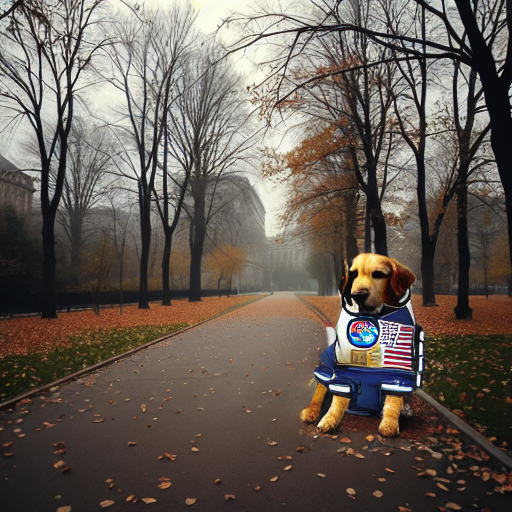

In [48]:
fc_control = FC_config(
    change_step=30,
    fg_1=2.213,
    fg_2=1,
    bg_1=0.657,
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=int(20.196),
    add_on=add_on_dict,
)
# Setting FreeCond control for SDI15
torch.manual_seed(777)
opt_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
opt_out[0]

  weighted_sum: 0.8573
  weighted_sum: 0.8439
  weighted_sum: 0.8322
  weighted_sum: 0.8227
  weighted_sum: 0.8162
  weighted_sum: 0.8129
  weighted_sum: 0.8131
  weighted_sum: 0.8166
  weighted_sum: 0.8231
  weighted_sum: 0.8320
  weighted_sum: 0.8426
  weighted_sum: 0.8543
  weighted_sum: 0.8661
  weighted_sum: 0.8775
  weighted_sum: 0.8877
  weighted_sum: 0.8964
  weighted_sum: 0.9031
  weighted_sum: 0.9079
  weighted_sum: 0.9107
  weighted_sum: 0.9118
  weighted_sum: 0.9114
  weighted_sum: 0.9098
  weighted_sum: 0.9076
  weighted_sum: 0.9049
  weighted_sum: 0.9024
  weighted_sum: 0.9002
  weighted_sum: 0.8986
  weighted_sum: 0.8978
  weighted_sum: 0.8980
  weighted_sum: 0.8992
  weighted_sum: 0.9013
  weighted_sum: 0.9043
  weighted_sum: 0.9079
  weighted_sum: 0.9121
  weighted_sum: 0.9167
  weighted_sum: 0.9215
  weighted_sum: 0.9263
  weighted_sum: 0.9310
  weighted_sum: 0.9354
  weighted_sum: 0.9394
  weighted_sum: 0.9428
  weighted_sum: 0.9456
  weighted_sum: 0.9476
  weighted_

  weighted_sum: 0.8252
  weighted_sum: 0.8358
  weighted_sum: 0.8475
  weighted_sum: 0.8596
  weighted_sum: 0.8718
  weighted_sum: 0.8836
  weighted_sum: 0.8948
  weighted_sum: 0.9052
  weighted_sum: 0.9147
  weighted_sum: 0.9232
  weighted_sum: 0.9309
  weighted_sum: 0.9379
  weighted_sum: 0.9442
  weighted_sum: 0.9500
  weighted_sum: 0.9551
  weighted_sum: 0.9596
  weighted_sum: 0.9633
  weighted_sum: 0.9663
  weighted_sum: 0.9683
  weighted_sum: 0.9691
  weighted_sum: 0.9688
  weighted_sum: 0.9671
  weighted_sum: 0.8278
  weighted_sum: 0.8103
  weighted_sum: 0.7948
  weighted_sum: 0.7819
  weighted_sum: 0.7720
  weighted_sum: 0.7651
  weighted_sum: 0.7613
  weighted_sum: 0.7602
  weighted_sum: 0.7613
  weighted_sum: 0.7639
  weighted_sum: 0.7675
  weighted_sum: 0.7713
  weighted_sum: 0.7750
  weighted_sum: 0.7782
  weighted_sum: 0.7805
  weighted_sum: 0.7820
  weighted_sum: 0.7825
  weighted_sum: 0.7822
  weighted_sum: 0.7814
  weighted_sum: 0.7804
  weighted_sum: 0.7795
  weighted_

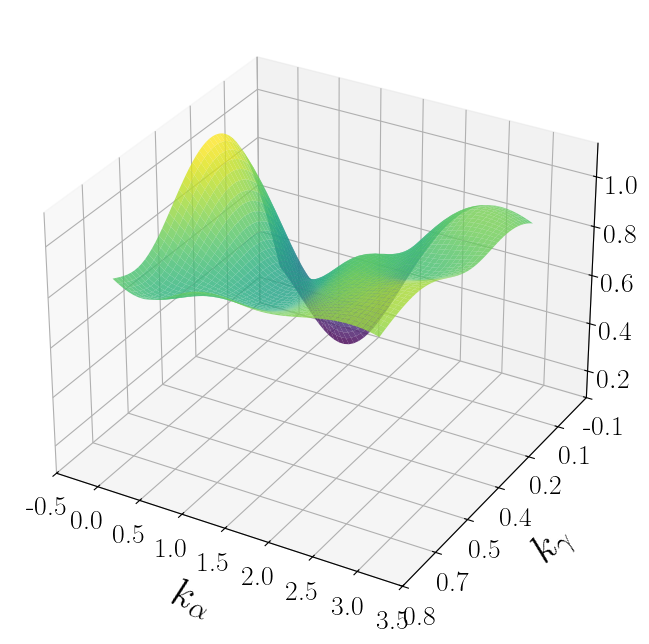

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


def plot_objective_manifold(
    optimizer, weights, fixed_params, param1="fg", param2="bg", resolution=50
):
    """
    繪製目標函數的 manifold。

    Args:
        optimizer (SurrogateOptimizer): 已初始化的 SurrogateOptimizer。
        weights (dict): 各指標的權重。
        fixed_params (dict): 固定的參數值，例如 {"fqth": 16}。
        param1 (str): x 軸參數名稱，例如 "fg"。
        param2 (str): y 軸參數名稱，例如 "bg"。
        resolution (int): 網格解析度。
    """
    # 獲取參數範圍
    param_bounds = optimizer.param_bounds
    param1_range = np.linspace(*param_bounds[param1], resolution)
    param2_range = np.linspace(*param_bounds[param2], resolution)

    # 創建網格
    param1_grid, param2_grid = np.meshgrid(param1_range, param2_range)
    objective_values = np.zeros_like(param1_grid)

    # 計算目標函數值
    for i in range(param1_grid.shape[0]):
        for j in range(param1_grid.shape[1]):
            params = {param1: param1_grid[i, j], param2: param2_grid[i, j]}
            params.update(fixed_params)  # 添加固定參數
            X = np.array([[params[p] for p in optimizer.params]])

            objective_values[i, j] = -optimizer._objective_function(
                X, weights
            )  # 取負值還原最大化

    # 使用 LaTeX 字體
    plt.rc("text", usetex=True)
    plt.rc("font", family="serif")

    # 繪製 3D 圖
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection="3d")

    # 绘制 3D 表面
    surface = ax.plot_surface(
        param1_grid, param2_grid, objective_values, cmap="viridis", alpha=0.8
    )

    # 设置标题和标签，确保使用 ax 方法
    # ax.set_title(r"Objective Manifold Surrogated by $\phi$", fontsize=25)
    ax.set_xlabel(r"$k_\alpha$", fontsize=30, labelpad=15)
    ax.set_ylabel(r"$k_\gamma$", fontsize=30, labelpad=15)

    # 修改 x 軸的 tick 標籤
    xticks = ax.get_xticks()
    ax.set_xticks(xticks)  # 确保刻度位置不变
    ax.set_xticklabels([f"{x-1:.1f}" for x in xticks], fontsize=25)

    # 修改 x 軸的 tick 標籤
    yticks = ax.get_yticks()
    ax.set_yticks(yticks)  # 确保刻度位置不变
    ax.set_yticklabels([f"{(32-x)/32:.1f}" for x in yticks], fontsize=25)

    # 修改 y 和 z 軸的 tick 標籤字體大小
    ax.tick_params(axis="both", which="major", labelsize=20)

    # 显示图形
    plt.show()

    # # 繪製等高線圖
    # plt.figure(figsize=(10, 8))
    # contour = plt.contourf(
    #     param1_grid, param2_grid, objective_values, levels=50, cmap="viridis"
    # )
    # plt.colorbar(contour)
    # plt.xlabel(f"$k_\alhpa$",,fontsize=25)
    # plt.ylabel(f"$k_\gamma$",fontsize=25)
    # plt.title("Objective Function Contour")

    # # 修改 x 軸的 tick 標籤
    # ax = plt.gca()
    # xticks = ax.get_xticks(fontsize=25)
    # ax.set_xticklabels([f"{x-1:.1f}" for x in xticks])

    # plt.show()
    # print("max objective", np.max(objective_values))


# 示例使用
weights = {
    "Image Reward": 1.0,
    "HPS V2.1": 1.0,
    "LPIPS": -1.0,
    "CLIP Similarity": 0.5,
    "IoU Score": 0.5,
    "DINO": 5,
}
plot_objective_manifold(optimizer, weights, {"bg": 0.5}, param1="fg", param2="fqth")

In [26]:
import numpy as np
import plotly.graph_objects as go

from freecond_src.bays import SurrogateOptimizer

optimizer = SurrogateOptimizer("fcip_surrogate_model.pkl")


def plot_objective_manifold_plotly(
    optimizer, weights, fixed_params, param1="fg", param2="bg", resolution=50
):
    """
    使用 Plotly 繪製目標函數的 3D surface 圖。

    Args:
        optimizer (SurrogateOptimizer): 已初始化的 SurrogateOptimizer。
        weights (dict): 各指標的權重。
        fixed_params (dict): 固定的參數值，例如 {"fqth": 16}。
        param1 (str): x 軸參數名稱，例如 "fg"。
        param2 (str): y 軸參數名稱，例如 "bg"。
        resolution (int): 網格解析度。
    """
    # 獲取參數範圍
    param_bounds = optimizer.param_bounds
    param1_range = np.linspace(*param_bounds[param1], resolution)
    param2_range = np.linspace(*param_bounds[param2], resolution)

    # 創建網格
    param1_grid, param2_grid = np.meshgrid(param1_range, param2_range)
    objective_values = np.zeros_like(param1_grid)

    # 計算目標函數值
    for i in range(param1_grid.shape[0]):
        for j in range(param1_grid.shape[1]):
            params = {param1: param1_grid[i, j], param2: param2_grid[i, j]}
            params.update(fixed_params)
            X = np.array([[params[p] for p in optimizer.params]])
            objective_values[i, j] = -optimizer._objective_function(X, weights)

    tick_param1_range = np.linspace(0, 3, resolution)
    tick_param2_range = np.linspace(0.25, 1, resolution)
    tick_param1_grid, tick_param2_grid = np.meshgrid(
        tick_param1_range, tick_param2_range
    )

    # 建立 3D surface 圖
    fig = go.Figure(
        data=[
            go.Surface(
                z=objective_values,
                x=tick_param1_grid,
                y=tick_param2_grid,
                colorscale="Viridis",
                opacity=0.9,
                showscale=False,  # Disable the color scale bar
            )
        ]
    )

    # 軸標籤和格式
    fig.update_layout(
        scene=dict(
            xaxis=dict(
                title=dict(text="k<sub>α</sub>", font=dict(size=50)),
                tickfont=dict(size=18),
                tickmode='array', # 告訴 Plotly 使用 array 來設定刻度
                tickvals=[0, 1, 2, 3], # 設定刻度位置
            ),
            yaxis=dict(
                title=dict(text="k<sub>γ</sub>", font=dict(size=50)),
                tickfont=dict(size=18),
                tickmode='array', # 告訴 Plotly 使用 array 來設定刻度
                tickvals=[0.3, 0.5, 0.7, 0.9], # 設定刻度位置
            ),
            zaxis=dict(
                title=dict(text="", font=dict(size=30)),
                tickfont=dict(size=18),

            ),
            aspectmode="cube",
        ),
        width=1600,  # Increase width for higher resolution
        height=1200,  # Increase height for higher resolution
        #margin=dict(l=10, r=0, t=10, b=10),  # Tight layout
    )

    # fig.update_layout(
    # scene=dict(
    #     xaxis=dict(
    #         title=dict(text="k<sub>α</sub>", font=dict(size=30)),
    #         tickfont=dict(size=14),
    #     ),
    #     yaxis=dict(
    #         title=dict(text="k<sub>γ</sub>", font=dict(size=30)),
    #         tickfont=dict(size=14),
    #     ),
    #     zaxis=dict(
    #         title=dict(text="", font=dict(size=30)),
    #         tickfont=dict(size=14),
    #     ),
    #     aspectmode="cube",
    # ),
    # width=900,
    # height=700,
    # )
    

    fig.show()


# 示例使用
weights = {
    "Image Reward": 1,
    "HPS V2.1": 2.0,
    "LPIPS": -0.3,
    "CLIP Similarity": 0.5,
    "IoU Score": 1,
    "DINO": 5,
}
plot_objective_manifold_plotly(
    optimizer, weights, {"bg": 0.5}, param1="fg", param2="fqth"
)

# load trainer parameters
  param_bounds: {'fg': (1, 4), 'bg': (0.0, 0.8), 'fqth': (8, 32)}
  output_names: ['Image Reward', 'HPS V2.1', 'PSNR', 'LPIPS', 'CLIP Similarity', 'IoU Score', 'DINO']


100%|██████████| 50/50 [00:02<00:00, 18.70it/s]


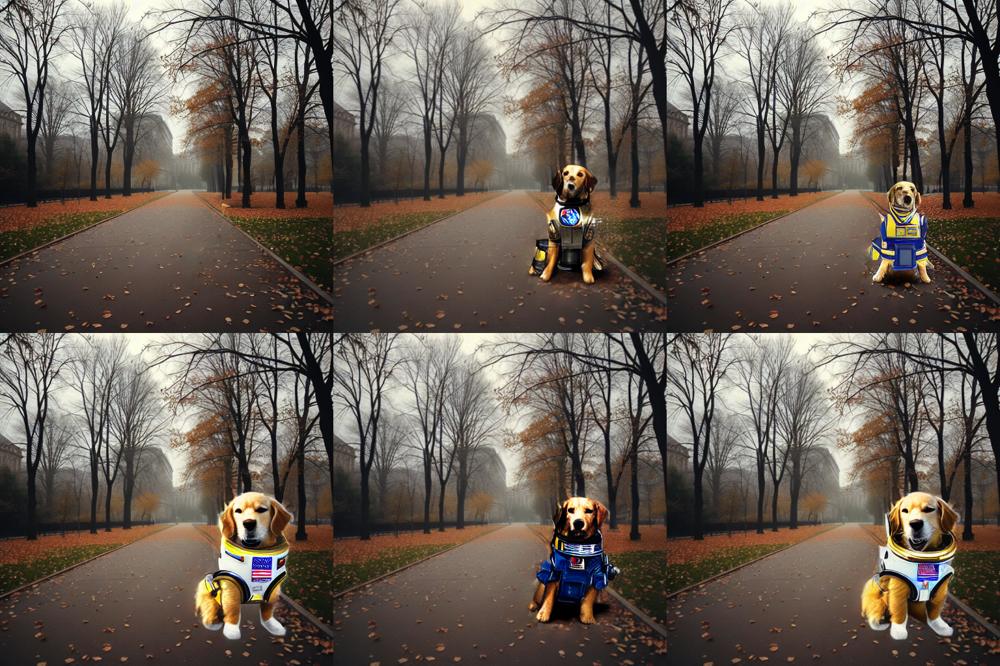

In [ ]:
from diffusers.utils import make_image_grid
import torch

# ❗ The demonstration output aren't identical the reported images in our research paper.
# Because we delete some unnecessary operation during revision, leading to the change of effect about random seed.

mask = Image.open("./demo_data/mask_1_2.png").convert("L").resize((512, 512))
init_image = Image.open("./demo_data/img_1_2.jpg").convert("RGB").resize((512, 512))
prompt = "A golden retriever wearing astronaut gear, in cyberpunk style"
nprompt = "word, bad quality, bad anatomy, ugly, mutation, blurry, error"
add_on_dict = {"latent_recovery": {}}

# Default to SDI
fc_control = FC_config(
    change_step=0,
    fg_1=1,
    fg_2=1,
    bg_1=0,
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=32,
    add_on=add_on_dict,
)
# Setting FreeCond control for SDI15
torch.manual_seed(777)
default_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)

fc_images = []

# FreeCond control for SDI 15, change alpha scale
fc_control = FC_config(
    change_step=0,
    fg_1=1,
    fg_2=3,
    bg_1=0,
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=32,
    add_on=add_on_dict,
)
torch.manual_seed(777)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])

# FreeCond control for SDI 15, change beta scale
torch.manual_seed(777)
fc_control = FC_config(
    change_step=0,
    fg_1=1,
    fg_2=1,
    bg_1=0,
    bg_2=0.5,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=4,
    add_on=add_on_dict,
)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])

# Setting FreeCond control for SDI, change freq
torch.manual_seed(777)
fc_control = FC_config(
    change_step=25,
    fg_1=1,
    fg_2=1,
    bg_1=0,
    bg_2=0,
    hq_1=0,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=24,
    add_on=add_on_dict,
)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])


# Setting FreeCond control for SDI, hybird
torch.manual_seed(777)
fc_control = FC_config(
    change_step=25,
    fg_1=3,
    fg_2=3,
    bg_1=0.3,
    bg_2=0.3,
    hq_1=0,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=24,
    add_on=add_on_dict,
)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])

# Setting FreeCond control for SDI, hybrid with stage
torch.manual_seed(777)
fc_control = FC_config(
    change_step=25,
    fg_1=1,
    fg_2=1.5,
    bg_1=0.2,
    bg_2=0.2,
    hq_1=0,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=24,
    add_on=add_on_dict,
)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])

make_image_grid([default_out[0]] + fc_images, rows=2, cols=3)